Day 3 — Image Filtering & Noise Removal**
- Convolution, kernels
- Blur filters (box, Gaussian, median)
- Sharpening basics
- **Hands-on:** Apply filters to noisy images, compare noise reduction
- **Deliverable:** `day03_filters.py`

# Day 3 — Image Filtering & Noise Removal

## Normalized kernal Vs non normalized Kernal using 2Dfiler


(<Axes: title={'center': 'Normalized Filter'}>,
 Text(0.5, 1.0, 'Normalized Filter'))

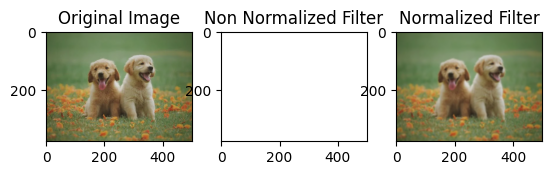

In [13]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('noisy.jpg')

Kernel = np.ones((5,5),np.float32) # non normalized kernel

N_Kernel = np.ones((5,5),np.float32)/25 # normalized kernel

dst = cv2.filter2D(img,-1,Kernel) # non normalized filter
N_dst = cv2.filter2D(img,-1,N_Kernel) # normalized filter

plt.subplot(1,3,1),plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)),plt.title('Original Image')
plt.subplot(1,3,2),plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)),plt.title('Non Normalized Filter')
plt.subplot(1,3,3),plt.imshow(cv2.cvtColor(N_dst, cv2.COLOR_BGR2RGB)),plt.title('Normalized Filter')

## Mean Blur

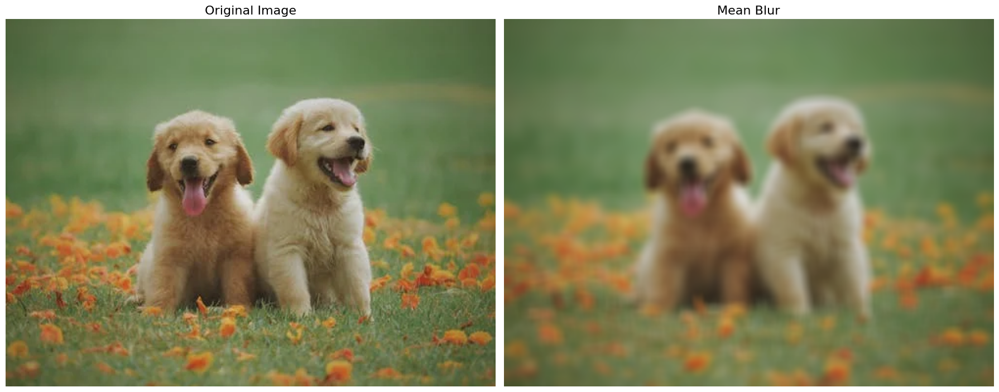

In [21]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Mean / Box Blur
mean = cv2.blur(img, (11, 11))   # kernel size 11x11


plt.figure(figsize=(18, 10))  # Width=18 inches, Height=10 inches

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image', fontsize=16)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(mean)
plt.title('Mean Blur', fontsize=16)
plt.axis('off')

plt.tight_layout()
plt.show()



## Box Filter

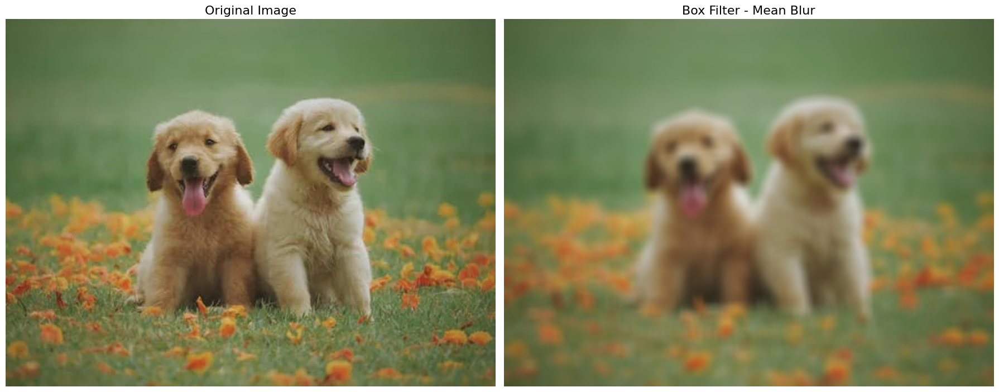

In [27]:
image = cv2.imread('noisy.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

box_blur =  cv2.boxFilter(image,-1,(11,11),normalize=True) # Mean Blur using boxfilter

plt.figure(figsize=(18, 10))  # Width=18 inches, Height=10 inches       
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image', fontsize=16)
plt.axis('off')     

plt.subplot(1, 2, 2)
plt.imshow(box_blur)
plt.title('Box Filter - Mean Blur', fontsize=16)
plt.axis('off') 
plt.tight_layout()

plt.show()


## Gaussian Blur

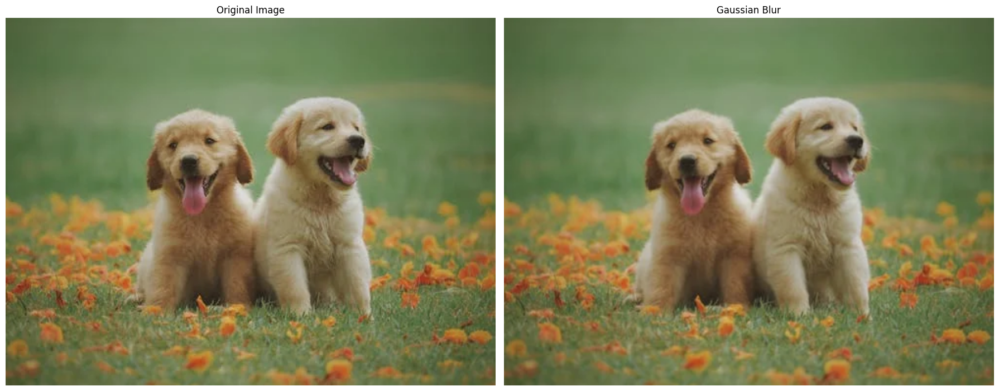

In [45]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Gaussian Blur
gaussian = cv2.GaussianBlur(img, (5, 5),0.5)
plt.figure(figsize=(18,10))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gaussian)
plt.title('Gaussian Blur')
plt.axis('off')
plt.tight_layout()
plt.show()


### EDGE DETECTION USING Gaussian Blur

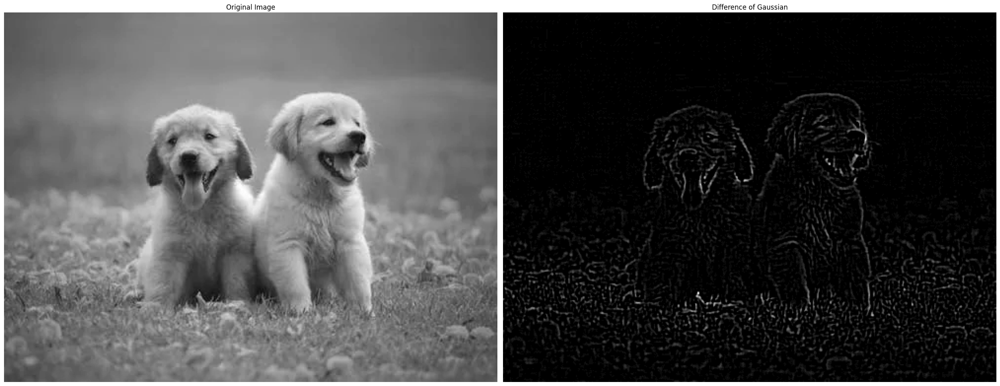

In [14]:
# Difference of Gaussian (DoG) 

import cv2
import matplotlib.pyplot as plt 

img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

g1= cv2.GaussianBlur(img,(5,5),1)
g2= cv2.GaussianBlur(img,(5,5),25)

dog = cv2.subtract(g1, g2)

plt.figure(figsize=(25,10))

plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')  
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(dog, cmap='gray')
plt.title('Difference of Gaussian')
plt.axis('off')


plt.tight_layout()
plt.show()





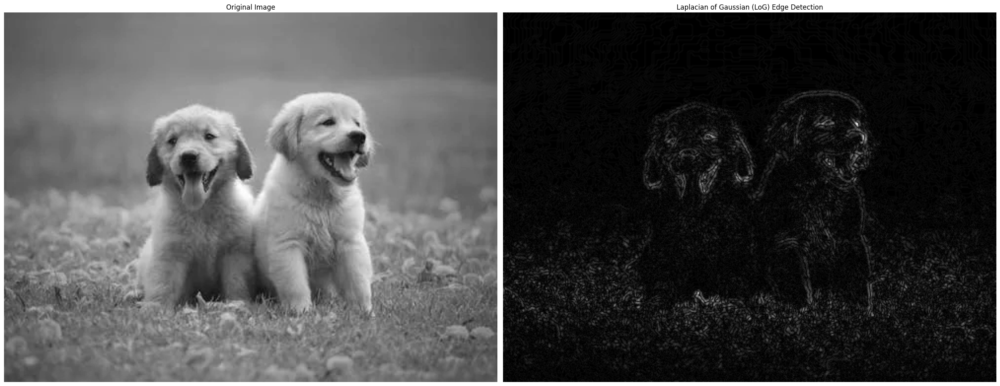

In [15]:
#LOG - Laplacian of Gaussian 

import numpy as np
import matplotlib.pyplot as plt

# Load image and convert to grayscale
img = cv2.imread('noisy.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Step 1: Gaussian Blur to reduce noise
gaussian = cv2.GaussianBlur(gray, (5, 5), 1)

# Step 2: Laplacian (second derivative)
log = cv2.Laplacian(gaussian, cv2.CV_64F)
abs_log = np.uint8(np.absolute(log))

# Display result
plt.figure(figsize=(25,10))
plt.subplot(1, 2, 1)
plt.imshow(gray, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(abs_log, cmap='gray')
plt.title('Laplacian of Gaussian (LoG) Edge Detection')
plt.axis('off')

plt.tight_layout()
plt.show()


## Median Blur

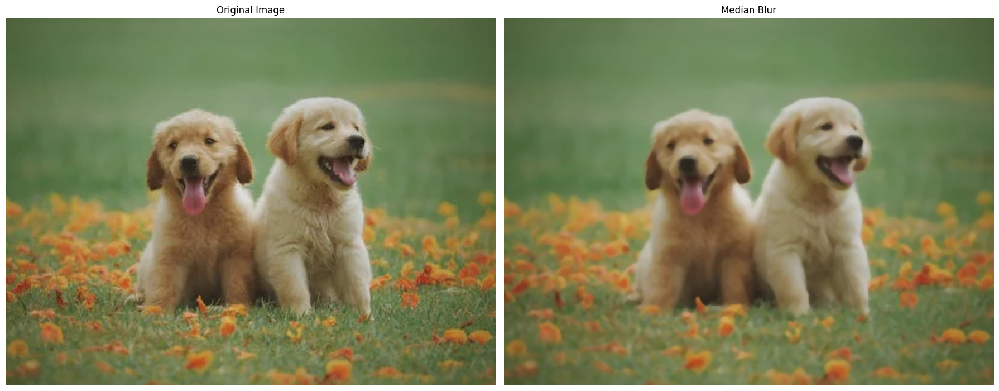

In [55]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Median Blur
median = cv2.medianBlur(img, 5)   

plt.figure(figsize=(18,10))
plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')  

plt.subplot(1,2,2)
plt.imshow(median)
plt.title('Median Blur')
plt.axis('off')

plt.tight_layout()
plt.show()


## BilateralFilter

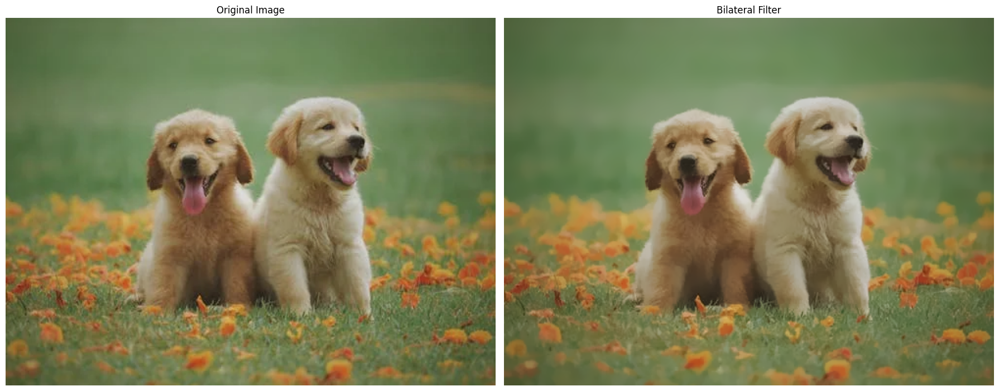

In [89]:
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Bilateral Filterbilateral = cv2.bilateralFilter(img,15,1000,150)
bilateral = cv2.bilateralFilter(img,15, 15,10)

plt.figure(figsize=(18,10))


plt.subplot(1, 2, 1)    
plt.imshow(img)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(bilateral)
plt.title('Bilateral Filter')
plt.axis('off')

plt.tight_layout()
plt.show()


## Compare All Blur Filters

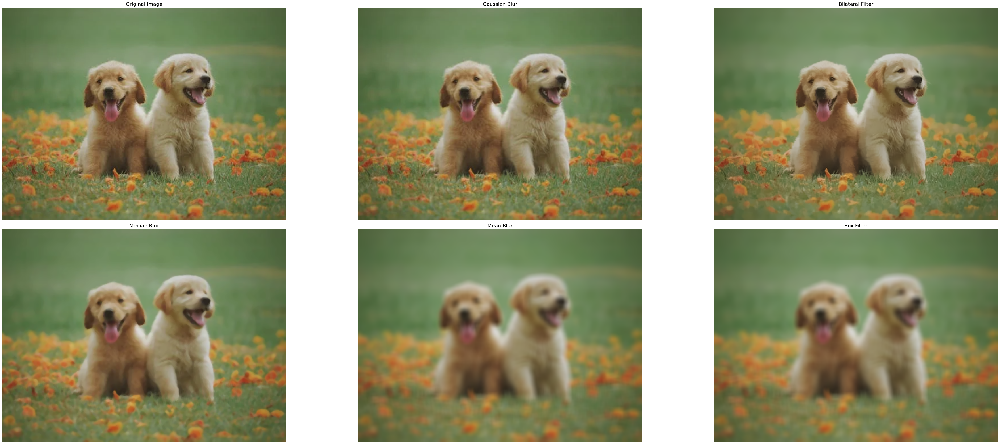

In [ ]:
from matplotlib import pyplot as plt
import cv2  

img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(50,20))

plt.subplot(2, 3, 1)
plt.imshow(img)
plt.title('Original Image', fontsize=16)
plt.axis('off')

plt.subplot(2, 3, 2)
gaussian = cv2.GaussianBlur(img, (5, 5),0.5)
plt.imshow(gaussian)
plt.title('Gaussian Blur', fontsize=16)
plt.axis('off')  

plt.subplot(2, 3, 3)
plt.imshow(bilateral)
plt.title('Bilateral Filter', fontsize=16)
plt.axis('off')

plt.subplot(2, 3, 4)
median = cv2.medianBlur(img, 5)   
plt.imshow(median)
plt.title('Median Blur', fontsize=16)      
plt.axis('off') 

plt.subplot(2, 3, 5)
mean = cv2.blur(img, (11, 11))                      
plt.imshow(mean)
plt.title('Mean Blur', fontsize=16)
plt.axis('off')

plt.subplot(2, 3, 6)
box_blur =  cv2.boxFilter(img,-1,(11,11),normalize=True) 
plt.imshow(box_blur)
plt.title('Box Filter', fontsize=16)
plt.axis('off')

plt.tight_layout()
plt.show()


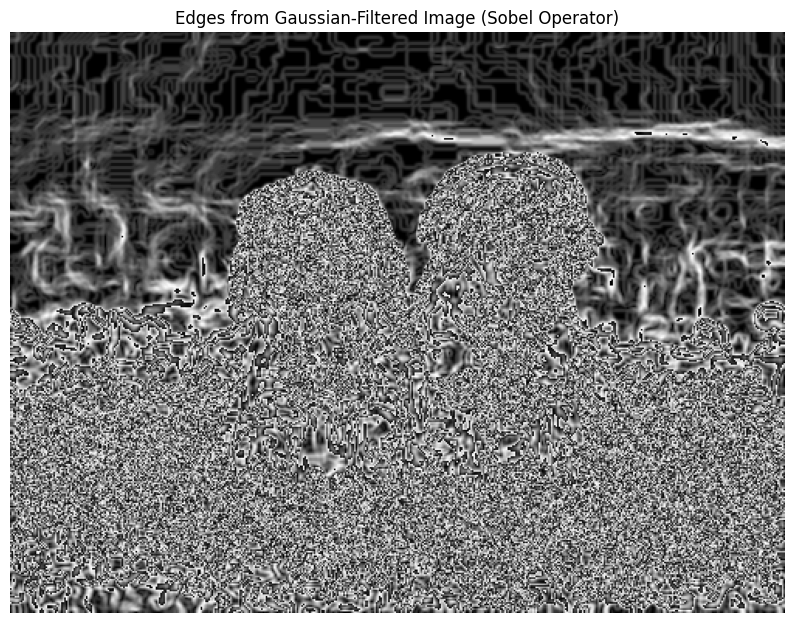

In [86]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Read and convert to grayscale
img = cv2.imread('noisy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Gaussian blur to reduce noise
gaussian = cv2.GaussianBlur(img, (5, 5), 1)

# ✅ Use cv2.Sobel (uppercase S)
sobel_x = cv2.Sobel(gaussian, cv2.CV_64F, 1, 0, ksize=5)
sobel_y = cv2.Sobel(gaussian, cv2.CV_64F, 0, 1, ksize=5)

# Compute edge magnitude
edges = cv2.magnitude(sobel_x, sobel_y)
edges = np.uint8(np.absolute(edges))

# Display result
plt.figure(figsize=(10, 10))
plt.imshow(edges, cmap='gray')
plt.title('Edges from Gaussian-Filtered Image (Sobel Operator)')
plt.axis('off')
plt.show()


## Sharpening Image